This notebook generates UMAP plots for the organoid dataset

# plotting UMAPs

## Imports

In [20]:
list_of_packages <- c("ggplot2", "dplyr", "tidyr", "circlize")
for (package in list_of_packages) {
    suppressPackageStartupMessages(
        suppressWarnings(
            library(
                package,
                character.only = TRUE,
                quietly = TRUE,
                warn.conflicts = FALSE
            )
        )
    )
}
#

In [21]:
# Get the current working directory and find Git root
find_git_root <- function() {
    # Get current working directory
    cwd <- getwd()
    
    # Check if current directory has .git
    if (dir.exists(file.path(cwd, ".git"))) {
        return(cwd)
    }
    
    # If not, search parent directories
    current_path <- cwd
    while (dirname(current_path) != current_path) {  # While not at root
        parent_path <- dirname(current_path)
        if (dir.exists(file.path(parent_path, ".git"))) {
            return(parent_path)
        }
        current_path <- parent_path
    }
    
    # If no Git root found, stop with error
    stop("No Git root directory found.")
}

# Find the Git root directory
root_dir <- find_git_root()
cat("Git root directory:", root_dir, "\n")

Git root directory: /Users/kaylorhuang/Documents/GitHub_Repos/Kaylor---NF1_organoid_profile_analysis 


In [ ]:
figures_path <- file.path(root_dir,"1.EDA/figures/umaps")
if (!dir.exists(figures_path)) {
  dir.create(figures_path, recursive = TRUE)
}

In [23]:
umap_theme <- theme(
        plot.title = element_text(hjust = 0.5, size = 16),
        axis.title.x = element_text(size = 14),
        axis.title.y = element_text(size = 14),
        legend.title = element_text(size = 14, hjust = 0.5),
        legend.text = element_text(size = 12)
    )

## Plotting UMAPs for organoid dataset

In [33]:
#SETTING UP INPUTS FOR GRAPHS

#organoid_umap_results <- arrow::read_parquet(file.path(root_dir,"1.EDA/results/umap/organoid_fs_umap.parquet"))
#head(organoid_umap_results)

max_projection_2D_sc_umap_results <- arrow::read_parquet(file.path(root_dir,"1.EDA/results/umap/2D/max_projection/sc_fs_umap.parquet"))
head(max_projection_2D_sc_umap_results)
#Combining STAURO and Staurosporine into one label
max_projection_2D_sc_umap_results <- max_projection_2D_sc_umap_results %>%
    mutate(Metadata_treatment = ifelse(Metadata_treatment == "STAURO", "Staurosporine", Metadata_treatment))

sc_3D_umap_results <- arrow::read_parquet(file.path(root_dir,"1.EDA/results/umap/3D/sc_fs_umap.parquet"))
head(sc_3D_umap_results)
sc_3D_umap_results <- sc_3D_umap_results %>%
    mutate(Metadata_treatment = ifelse(Metadata_treatment == "STAURO", "Staurosporine", Metadata_treatment))


middle_slice_2D_sc_umap_results <- arrow::read_parquet(file.path(root_dir,"1.EDA/results/umap/2D/middle_slice/sc_fs_umap.parquet"))
head(middle_slice_2D_sc_umap_results)
middle_slice_2D_sc_umap_results <- middle_slice_2D_sc_umap_results %>%
    mutate(Metadata_treatment = ifelse(Metadata_treatment == "STAURO", "Staurosporine", Metadata_treatment))

Metadata_WellRow,Metadata_WellCol,Metadata_Well,Metadata_treatment,Metadata_dose,Metadata_unit,Metadata_Treatment,Metadata_Target,Metadata_Class,Metadata_Therapeutic_Categories,⋯,Metadata_Plate,Metadata_Cells_Number_Object_Number,Metadata_Cytoplasm_Parent_Cells,Metadata_Cytoplasm_Parent_Nuclei,Metadata_Nuclei_Number_Object_Number,Metadata_patient_tumor,Metadata_patient,Metadata_tumor,UMAP1,UMAP2
<chr>,<int>,<chr>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,⋯,<chr>,<int>,<int>,<int>,<int>,<chr>,<chr>,<chr>,<dbl>,<dbl>
C,2,C2,Staurosporine,10,nM,Staurosporine,Apoptosis induction,Small Molecule,Experimental,⋯,NF0014,1,1,1,1,NF0014_T1,NF0014,T1,13.36766,8.345984
C,2,C2,Staurosporine,10,nM,Staurosporine,Apoptosis induction,Small Molecule,Experimental,⋯,NF0014,2,2,2,2,NF0014_T1,NF0014,T1,13.43125,8.361634
C,2,C2,Staurosporine,10,nM,Staurosporine,Apoptosis induction,Small Molecule,Experimental,⋯,NF0014,3,3,3,3,NF0014_T1,NF0014,T1,13.35517,8.328794
C,2,C2,Staurosporine,10,nM,Staurosporine,Apoptosis induction,Small Molecule,Experimental,⋯,NF0014,4,4,4,4,NF0014_T1,NF0014,T1,13.37926,8.368149
C,2,C2,Staurosporine,10,nM,Staurosporine,Apoptosis induction,Small Molecule,Experimental,⋯,NF0014,5,5,5,5,NF0014_T1,NF0014,T1,13.35502,8.357718
C,2,C2,Staurosporine,10,nM,Staurosporine,Apoptosis induction,Small Molecule,Experimental,⋯,NF0014,6,6,6,6,NF0014_T1,NF0014,T1,13.27870,8.337650


Metadata_patient_tumor,Metadata_patient_id,Metadata_patient,Metadata_tumor,Metadata_object_id,Metadata_unit,Metadata_dose,Metadata_treatment,Metadata_Target,Metadata_Class,⋯,Metadata_Well,Metadata_parent_organoid,Metadata_cqc.organoid_flagged,Metadata_cqc.nan_detected,Metadata_cqc.missing_parent_organoid,Metadata_cqc.small_nuclei_outlier,Metadata_cqc.large_nuclei_outlier,Metadata_cqc.mass_displacement_outlier,UMAP1,UMAP2
<chr>,<chr>,<chr>,<chr>,<int>,<chr>,<dbl>,<chr>,<chr>,<chr>,⋯,<chr>,<int>,<lgl>,<lgl>,<lgl>,<lgl>,<lgl>,<lgl>,<dbl>,<dbl>
NF0014_T1,NF0014_T1,NF0014,T1,61,uM,1,Fimepinostat,PI3K and HDAC inhibitor,Small Molecule,⋯,E5,-1,FALSE,FALSE,TRUE,FALSE,FALSE,FALSE,15.96665,2.6224227
NF0014_T1,NF0014_T1,NF0014,T1,114,uM,1,Fimepinostat,PI3K and HDAC inhibitor,Small Molecule,⋯,E5,-1,FALSE,FALSE,TRUE,FALSE,FALSE,FALSE,15.25360,4.8424664
NF0014_T1,NF0014_T1,NF0014,T1,184,uM,1,Fimepinostat,PI3K and HDAC inhibitor,Small Molecule,⋯,E5,-1,FALSE,FALSE,TRUE,FALSE,FALSE,FALSE,2.41517,8.9231701
NF0014_T1,NF0014_T1,NF0014,T1,219,uM,1,Fimepinostat,PI3K and HDAC inhibitor,Small Molecule,⋯,E5,-1,FALSE,FALSE,TRUE,FALSE,FALSE,FALSE,15.92349,3.3527954
NF0014_T1,NF0014_T1,NF0014,T1,255,uM,1,Fimepinostat,PI3K and HDAC inhibitor,Small Molecule,⋯,E5,-1,FALSE,FALSE,TRUE,FALSE,FALSE,FALSE,10.49919,0.9640226
NF0014_T1,NF0014_T1,NF0014,T1,54,uM,1,Fimepinostat,PI3K and HDAC inhibitor,Small Molecule,⋯,D5,-1,FALSE,FALSE,TRUE,FALSE,FALSE,FALSE,10.49397,0.9657854


Metadata_WellRow,Metadata_WellCol,Metadata_Well,Metadata_treatment,Metadata_dose,Metadata_unit,Metadata_Treatment,Metadata_Target,Metadata_Class,Metadata_Therapeutic_Categories,⋯,Metadata_Plate,Metadata_Cells_Number_Object_Number,Metadata_Cytoplasm_Parent_Cells,Metadata_Cytoplasm_Parent_Nuclei,Metadata_Nuclei_Number_Object_Number,Metadata_patient_tumor,Metadata_patient,Metadata_tumor,UMAP1,UMAP2
<chr>,<int>,<chr>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,⋯,<chr>,<int>,<int>,<int>,<int>,<chr>,<chr>,<chr>,<dbl>,<dbl>
C,2,C2,Staurosporine,10,nM,Staurosporine,Apoptosis induction,Small Molecule,Experimental,⋯,NF0014,1,1,2,2,NF0014_T1,NF0014,T1,12.289029,-15.78946
C,2,C2,Staurosporine,10,nM,Staurosporine,Apoptosis induction,Small Molecule,Experimental,⋯,NF0014,2,2,3,3,NF0014_T1,NF0014,T1,12.334114,-15.75360
C,2,C2,Staurosporine,10,nM,Staurosporine,Apoptosis induction,Small Molecule,Experimental,⋯,NF0014,3,3,4,4,NF0014_T1,NF0014,T1,12.490737,-15.66635
D,2,D2,Digoxin,1,uM,Digoxin,Na+/K+ pump inhibitor,Small Molecule,Cardiac Glycosides,⋯,NF0014,1,1,2,2,NF0014_T1,NF0014,T1,12.406902,-11.56255
D,2,D2,Digoxin,1,uM,Digoxin,Na+/K+ pump inhibitor,Small Molecule,Cardiac Glycosides,⋯,NF0014,2,2,3,3,NF0014_T1,NF0014,T1,9.962565,-13.41369
D,2,D2,Digoxin,1,uM,Digoxin,Na+/K+ pump inhibitor,Small Molecule,Cardiac Glycosides,⋯,NF0014,3,3,4,4,NF0014_T1,NF0014,T1,9.873981,-12.05968


### Color mapping for MOAs

In [ ]:
# set custom colors for each MOA
custom_MOA_palette <- c(
    'Control' = "#5a5c5d",
    'MEK1/2 inhibitor' = "#882E8B",
    

    'HDAC inhibitor' = "#1E6B61",
    'PI3K and HDAC inhibitor' = "#2E6B8B",
    'PI3K inhibitor'="#0092E0",

    'receptor tyrosine kinase inhibitor' = "#576A20",
    'tyrosine kinase inhibitor' = "#646722",

    'mTOR inhibitor' = "#ACE089",  
    'IGF-1R inhibitor' = "#ACE040",

    'HSP90 inhibitor'="#33206A",
    'Apoptosis induction'="#272267",
    'Na+/K+ pump inhibitor' = "#A16C28",
    'histamine H1 receptor antagonist' = "#3A8F00",
    'DNA binding' = "#174F17",
    'BRD4 inhibitor' = "#ff0000"
    
)
    

### Color mapping for Treatments

In [34]:
# Set custom colors for each treatment
custom_treatment_palette <- c(
    'DMSO' = "#5a5c5d",              # Control - gray
    'Staurosporine' = "#7D2780",     # Dark purple
    
    'Fimepinostat' = "#1E6B61",      # Teal (HDAC inhibitor)
    'Copanlisib' = "#0092E0",        # Blue (PI3K inhibitor)
    
    'Imatinib' = "#576A20",          # Olive green
    'Nilotinib' = "#646722",         # Yellow-green
    'Cabozantinib' = "#758B2D",      # Light olive
    
    'Everolimus' = "#ACE089",        # Light green (mTOR inhibitor)
    'Rapamycin' = "#90D070",         # Medium green (mTOR inhibitor)
    'Linsitinib' = "#ACE040",        # Yellow-green (IGF-1R inhibitor)
    
    'Onalespib' = "#33206A",         # Dark purple (HSP90 inhibitor)
    'Digoxin' = "#A16C28",           # Orange-brown
    'Ketotifen' = "#3A8F00",         # Green
    
    'Binimetinib' = "#ff0000",       # Red (MEK inhibitor)
    'Mirdametinib' = "#cc0000",      # Dark red (MEK inhibitor)
    'Trametinib' = "#ff3333",        # Light red (MEK inhibitor)
    'Selumetinib' = "#ff6666"        # Lighter red (MEK inhibitor)
)

### Organoid features

In [ ]:
head(organoid_umap_results)

patient,object_id,unit,dose,treatment,image_set,Well,single_cell_count,Target,Class,Therapeutic_Categories,UMAP1,UMAP2
<chr>,<int>,<chr>,<int>,<chr>,<chr>,<chr>,<dbl>,<chr>,<chr>,<chr>,<dbl>,<dbl>
NF0014,40,uM,10,Mirdametinib,G8-1,G8,8,MEK1/2 inhibitor,Small Molecule,Kinase Inhibitor,6.262684,7.214601
NF0014,24,uM,1,Fimepinostat,D5-1,D5,5,PI3K and HDAC inhibitor,Small Molecule,Investigational,11.317762,6.573132
NF0014,85,uM,1,Mirdametinib,F8-1,F8,9,MEK1/2 inhibitor,Small Molecule,Kinase Inhibitor,5.369102,6.784002
NF0014,18,nM,10,Staurosporine,G11-1,G11,1,Apoptosis induction,Small Molecule,Experimental,6.368983,7.138305
NF0014,24,uM,1,Binimetinib,G7-1,G7,7,MEK1/2 inhibitor,Small Molecule,Kinase Inhibitor,6.304853,7.268643
NF0014,30,uM,1,Copanlisib,E3-2,E3,9,PI3K inhibitor,Small Molecule,Kinase Inhibitor,5.932819,7.027518


Warning message:
“Removed 461 rows containing missing values or values outside the scale range
(`geom_point()`).”
Warning message:
“Removed 461 rows containing missing values or values outside the scale range
(`geom_point()`).”


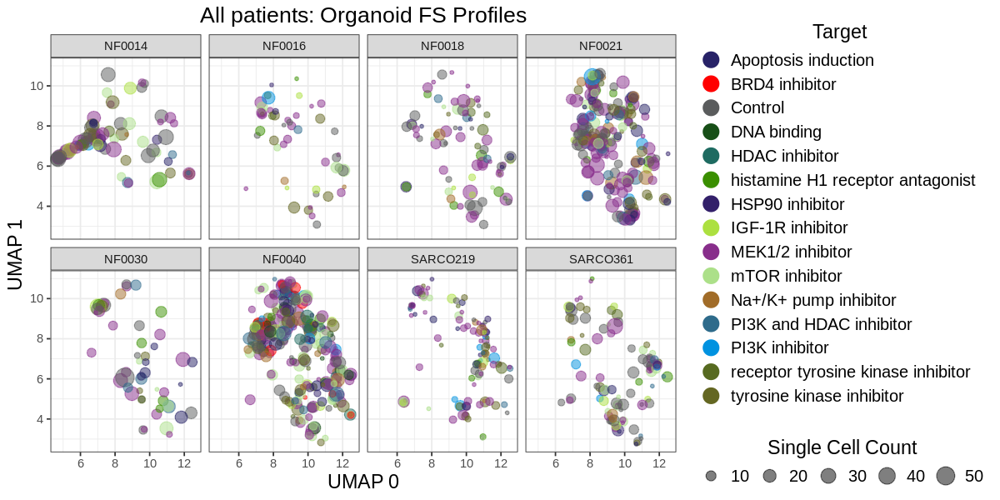

In [ ]:
width <- 10
height <- 5
options(repr.plot.width = width, repr.plot.height = height)
umap_organoid_plot <- (
    ggplot(organoid_umap_results, aes(x = UMAP1, y = UMAP2, color = Target, size = single_cell_count))
    + geom_point(alpha = 0.5)
    + scale_color_manual(values = custom_MOA_palette)
    + labs(title = "All patients: Organoid FS Profiles", x = "UMAP 0", y = "UMAP 1")
    + theme_bw()
    + umap_theme
    
    + guides(
        size = guide_legend(
            title = "Single Cell Count",
            text = element_text(size = 16, hjust = 0.5, position = "top"),
            nrow = 1,            
            ),
        color = guide_legend(
            title = "Target",
            text = element_text(size = 16, hjust = 0.5),
            override.aes = list(alpha = 1,size = 5),
            ncol = 1
        )
    )
    + facet_wrap(~patient, nrow = 2)
)
organoid_features_path <- file.path(figures_path, "all_patients_umap_organoid_features_facet_by_patient.png")
ggsave(umap_organoid_plot, file = organoid_features_path, width = width, height = height, dpi = 300)
umap_organoid_plot

In [ ]:
patients <- unique(organoid_umap_results$patient)
hex_codes <- c(
"#86C436",
"#BFD468",
"#36C4BB",
"#68D4B4",
"#7336C4",
"#7E68D4",
"#C4363F",
"#D46888"
)
patient_color_palette <- setNames(hex_codes[1:length(patients)], patients)

Warning message:
“Removed 461 rows containing missing values or values outside the scale range
(`geom_point()`).”
Warning message:
“Removed 461 rows containing missing values or values outside the scale range
(`geom_point()`).”


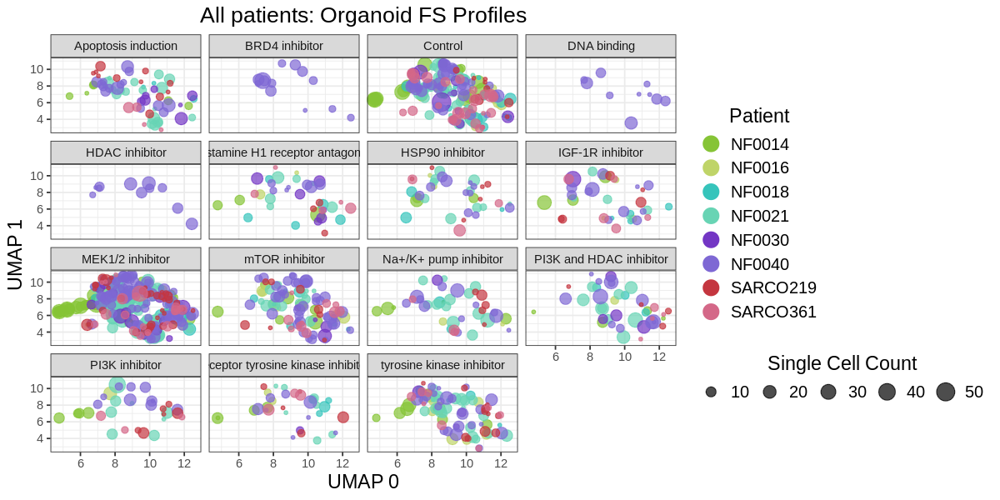

In [ ]:
width <- 10
height <- 5
options(repr.plot.width = width, repr.plot.height = height)
umap_organoid_plot <- (
    ggplot(organoid_umap_results, aes(x = UMAP1, y = UMAP2, color = patient, size = single_cell_count))
    + geom_point(alpha = 0.7)
    + scale_color_manual(values = patient_color_palette)
    + labs(title = "All patients: Organoid FS Profiles", x = "UMAP 0", y = "UMAP 1")
    + theme_bw()
    + umap_theme
    + guides(
        size = guide_legend(
            title = "Single Cell Count",
            text = element_text(size = 16, hjust = 0.5, position = "top"),
            nrow = 1,
            ),
        color = guide_legend(
            title = "Patient",
            text = element_text(size = 16, hjust = 0.5),
            override.aes = list(alpha = 1,size = 5),
            ncol = 1
        )
    )
    + facet_wrap(~Target, nrow = 4)
)
organoid_features_path <- file.path(figures_path, "all_patients_umap_organoid_features_facet_by_target.png")

ggsave(umap_organoid_plot, file = organoid_features_path, width = width, height = height, dpi = 300)
umap_organoid_plot

In [ ]:
# get just the DMSO treatments
organoid_umap_results_dmsos <- organoid_umap_results %>% filter(Target == "Control")

Warning message:
“Removed 82 rows containing missing values or values outside the scale range
(`geom_point()`).”
Warning message:
“Removed 82 rows containing missing values or values outside the scale range
(`geom_point()`).”


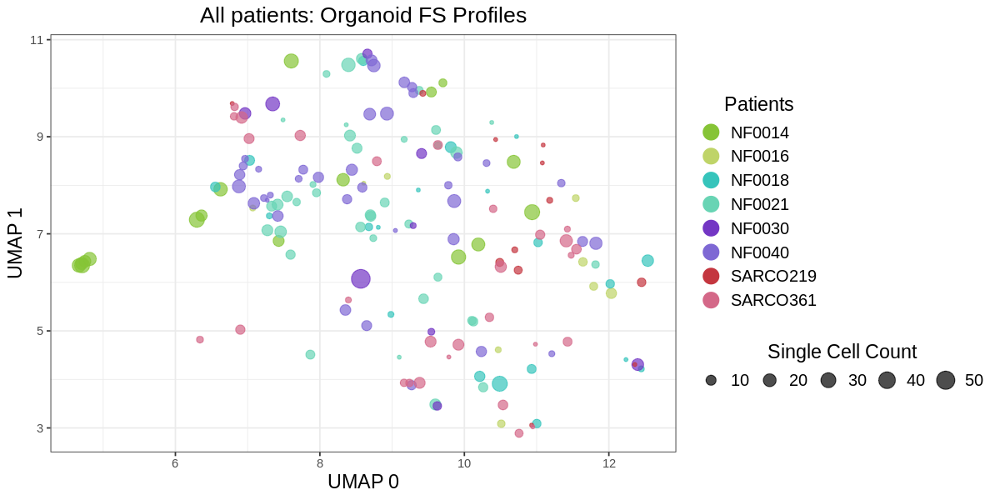

In [ ]:
width <- 10
height <- 5
options(repr.plot.width = width, repr.plot.height = height)
umap_organoid_plot <- (
    ggplot(organoid_umap_results_dmsos, aes(x = UMAP1, y = UMAP2, color = patient, size = single_cell_count))
    + geom_point(alpha = 0.7)
    + scale_color_manual(values = patient_color_palette)
    + labs(title = "All patients: Organoid FS Profiles", x = "UMAP 0", y = "UMAP 1")
    + theme_bw()
    + umap_theme

    + guides(
        size = guide_legend(
            title = "Single Cell Count",
            text = element_text(size = 16, hjust = 0.5, position = "top"),
            nrow = 1,
            ),
        color = guide_legend(
            title = "Patients",
            text = element_text(size = 16, hjust = 0.5),
            override.aes = list(alpha = 1,size = 5),
            ncol = 1
        )
    )
)
organoid_features_path <- file.path(figures_path, "all_patients_controls_only_umap_organoid_features.png")

ggsave(umap_organoid_plot, file = organoid_features_path, width = width, height = height, dpi = 300)
umap_organoid_plot

## Single cell features

2D MIP faceted by patients, colored by treatment

Warning message:
“Removed 654 rows containing missing values or values outside the scale range
(`geom_point()`).”
Warning message:
“Removed 654 rows containing missing values or values outside the scale range
(`geom_point()`).”
Warning message:
“Removed 654 rows containing missing values or values outside the scale range
(`geom_point()`).”


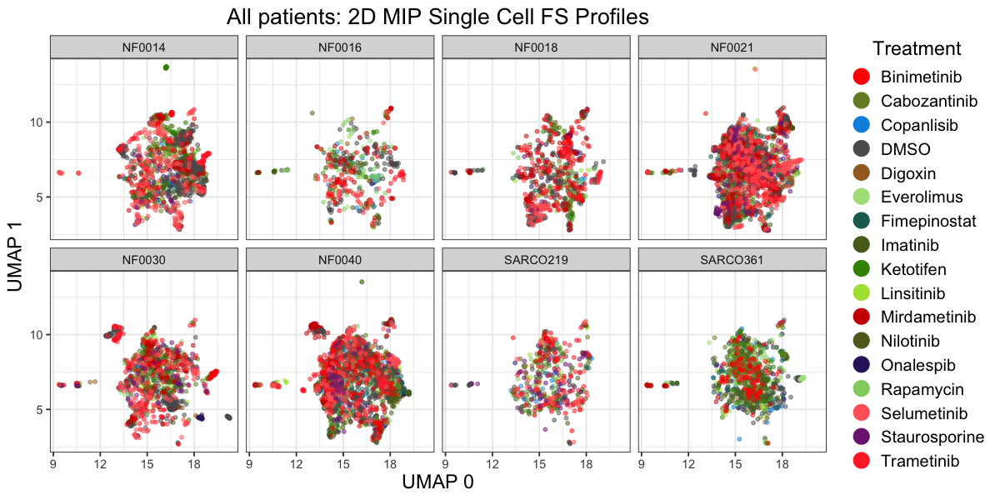

In [53]:
width <- 10
height <- 5
options(repr.plot.width = width, repr.plot.height = height)
umap_sc_plot <- (
    ggplot(max_projection_2D_sc_umap_results, aes(x = UMAP1, y = UMAP2, color = Metadata_treatment))
    + geom_point(alpha = 0.5, size = 1)
    + scale_color_manual(values = custom_treatment_palette)
    + labs(title = "All patients: 2D MIP Single Cell FS Profiles", x = "UMAP 0", y = "UMAP 1")
    + theme_bw()
    + umap_theme

    + guides(
        color = guide_legend(
            title = "Treatment",
            override.aes = list(alpha = 1,size = 5),
            ncol = 1
        )
    )
    + facet_wrap(~Metadata_patient, nrow = 2)
)
sc_features_path <- file.path(figures_path, "all_patients_umap_2D_Max_intensity_sc_features_facet_by_patient.png")
ggsave(umap_sc_plot, file = sc_features_path, width = width, height = height, dpi = 300)
umap_sc_plot

2D Middle slice faceted by patients, colored by treatment

Warning message:
“Removed 1412 rows containing missing values or values outside the scale range
(`geom_point()`).”
Warning message:
“Removed 1412 rows containing missing values or values outside the scale range
(`geom_point()`).”
Warning message:
“Removed 1412 rows containing missing values or values outside the scale range
(`geom_point()`).”


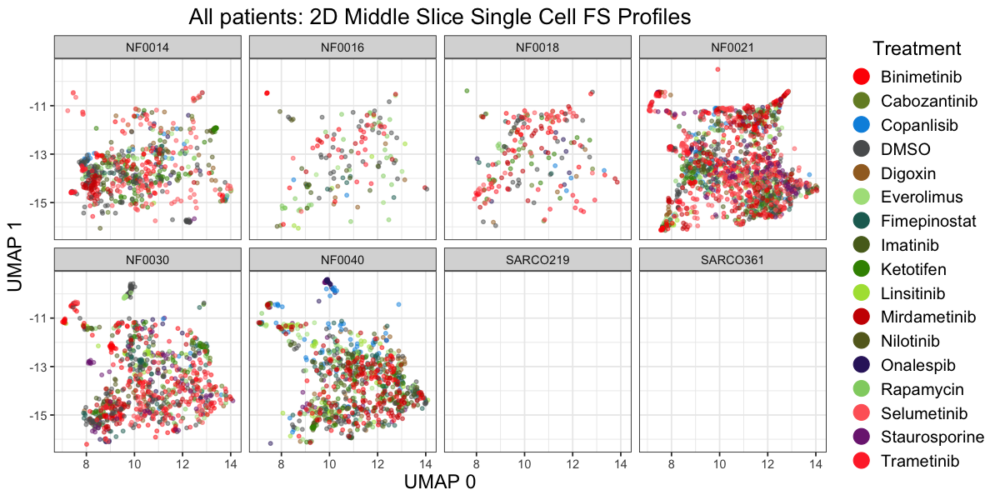

In [54]:
width <- 10
height <- 5
options(repr.plot.width = width, repr.plot.height = height)
umap_sc_plot <- (
    ggplot(middle_slice_2D_sc_umap_results, aes(x = UMAP1, y = UMAP2, color = Metadata_treatment))
    + geom_point(alpha = 0.5, size = 1)
    + scale_color_manual(values = custom_treatment_palette)
    + labs(title = "All patients: 2D Middle Slice Single Cell FS Profiles", x = "UMAP 0", y = "UMAP 1")
    + theme_bw()
    + umap_theme

    + guides(
        color = guide_legend(
            title = "Treatment",
            override.aes = list(alpha = 1,size = 5),
            ncol = 1
        )
    )
    + facet_wrap(~Metadata_patient, nrow = 2)
)
sc_features_path <- file.path(figures_path, "all_patients_umap_2D_middle_slice_sc_features_facet_by_patient.png")
ggsave(umap_sc_plot, file = sc_features_path, width = width, height = height, dpi = 300)
umap_sc_plot

3D faceted by patients, colored by treatment

Warning message:
“Removed 10886 rows containing missing values or values outside the scale range
(`geom_point()`).”
Warning message:
“Removed 10886 rows containing missing values or values outside the scale range
(`geom_point()`).”
Warning message:
“Removed 10886 rows containing missing values or values outside the scale range
(`geom_point()`).”


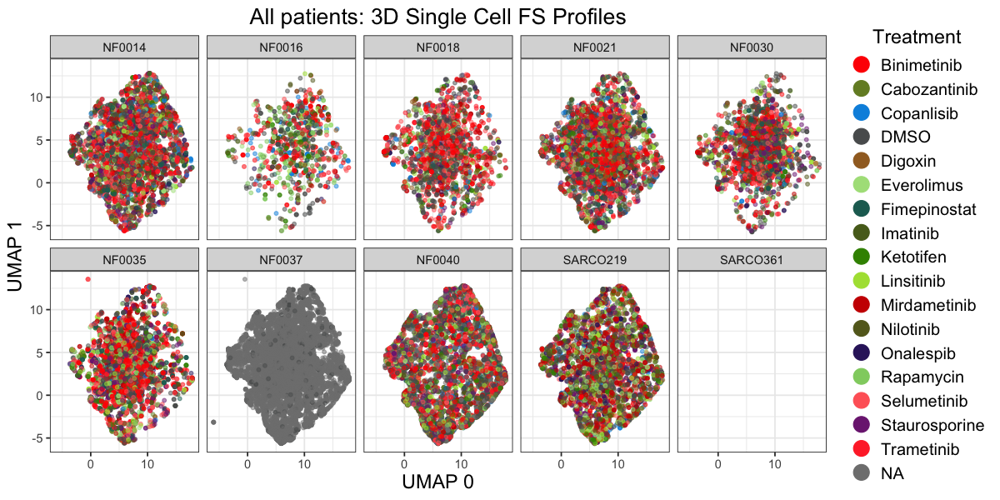

In [55]:
width <- 10
height <- 5
options(repr.plot.width = width, repr.plot.height = height)
umap_sc_plot <- (
    ggplot(sc_3D_umap_results, aes(x = UMAP1, y = UMAP2, color = Metadata_treatment))
    + geom_point(alpha = 0.5, size = 1)
    + scale_color_manual(values = custom_treatment_palette)
    + labs(title = "All patients: 3D Single Cell FS Profiles", x = "UMAP 0", y = "UMAP 1")
    + theme_bw()
    + umap_theme

    + guides(
        color = guide_legend(
            title = "Treatment",
            override.aes = list(alpha = 1,size = 5),
            ncol = 1
        )
    )
    + facet_wrap(~Metadata_patient, nrow = 2)
)
sc_features_path <- file.path(figures_path, "all_patients_umap_3D_sc_features_facet_by_patient.png")
ggsave(umap_sc_plot, file = sc_features_path, width = width, height = height, dpi = 300)
umap_sc_plot

In [ ]:
patients <- unique(sc_umap_results$patient)
hex_codes <- c(
"#86C436",
"#BFD468",
"#36C4BB",
"#68D4B4",
"#7336C4",
"#7E68D4",
"#C4363F",
"#D46888"
)
patient_color_palette <- setNames(hex_codes[1:length(patients)], patients)

Warning message:
“Removed 1351 rows containing missing values or values outside the scale range
(`geom_point()`).”
Warning message:
“Removed 1351 rows containing missing values or values outside the scale range
(`geom_point()`).”


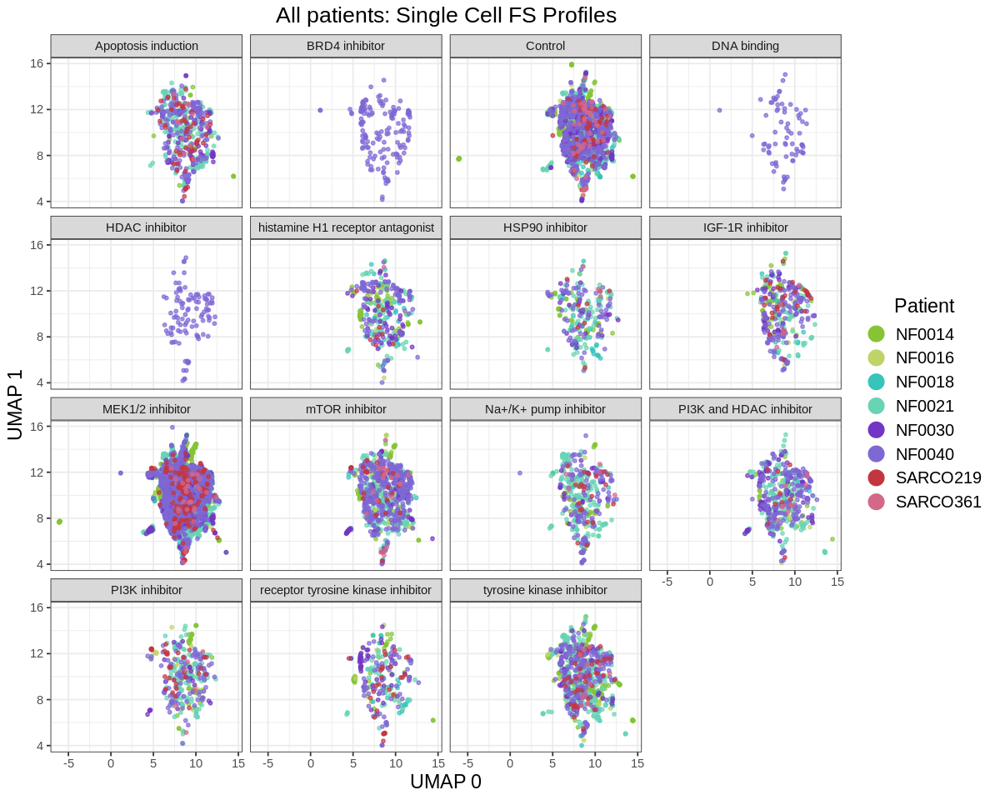

In [ ]:
width <- 10
height <- 8
options(repr.plot.width = width, repr.plot.height = height)
umap_sc_plot <- (
    ggplot(sc_umap_results, aes(x = UMAP1, y = UMAP2, color = patient))
    + geom_point(alpha = 0.7, size = 1)
    + scale_color_manual(values = patient_color_palette)
    + labs(title = "All patients: Single Cell FS Profiles", x = "UMAP 0", y = "UMAP 1")
    + theme_bw()
    + umap_theme

    + guides(
        color = guide_legend(
            title = "Patient",
            text = element_text(size = 16, hjust = 0.5),
            override.aes = list(alpha = 1,size = 5),
            # nrow = 2,
            ncol = 1
            # position = "bottom"
        )
    )
    + facet_wrap(~Target, nrow = 4)
)
sc_features_path <- file.path(figures_path, "all_patients_umap_sc_features_facet_by_target.png")

ggsave(umap_sc_plot, file = sc_features_path, width = width, height = height, dpi = 300)
umap_sc_plot

In [ ]:
# get just the DMSO treatments
sc_umap_results_dmsos <- sc_umap_results %>% filter(Target == "Control")

Warning message:
“Removed 333 rows containing missing values or values outside the scale range
(`geom_point()`).”
Warning message:
“Removed 333 rows containing missing values or values outside the scale range
(`geom_point()`).”


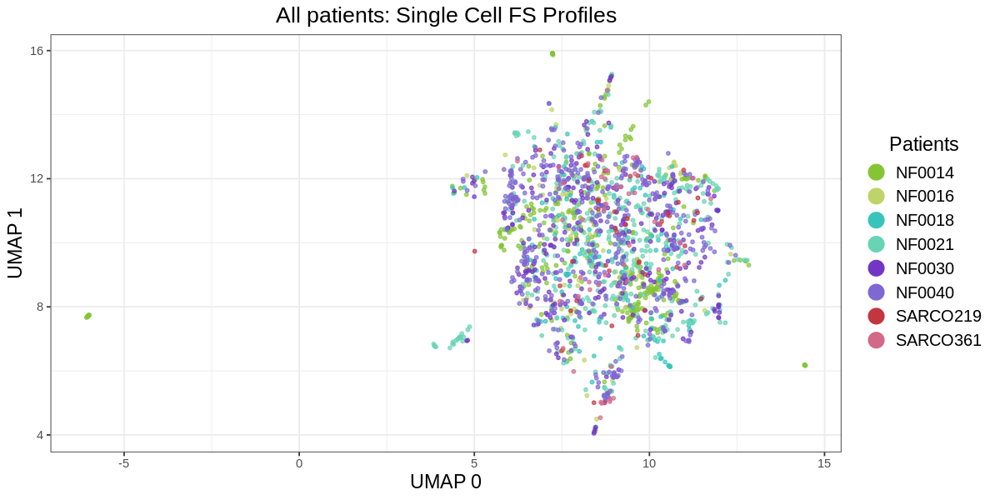

In [ ]:
width <- 10
height <- 5
options(repr.plot.width = width, repr.plot.height = height)
umap_sc_plot <- (
    ggplot(sc_umap_results_dmsos, aes(x = UMAP1, y = UMAP2, color = patient))
    + geom_point(alpha = 0.7, size = 1)
    + scale_color_manual(values = patient_color_palette)
    + labs(title = "All patients: Single Cell FS Profiles", x = "UMAP 0", y = "UMAP 1")
    + theme_bw()
    + umap_theme

    + guides(
        color = guide_legend(
            title = "Patients",
            text = element_text(size = 16, hjust = 0.5),
            override.aes = list(alpha = 1,size = 5),
            # nrow = 2,
            ncol = 1
            # position = "bottom"
        )
    )
)
sc_features_path <- file.path(figures_path, "all_patients_controls_only_umap_sc_features.png")

ggsave(umap_sc_plot, file = sc_features_path, width = width, height = height, dpi = 300)
umap_sc_plot

All patients 2D MIP single cell fs profiles colored by treatment

Warning message:
“Removed 654 rows containing missing values or values outside the scale range
(`geom_point()`).”
Warning message:
“Removed 654 rows containing missing values or values outside the scale range
(`geom_point()`).”
Warning message:
“Removed 654 rows containing missing values or values outside the scale range
(`geom_point()`).”


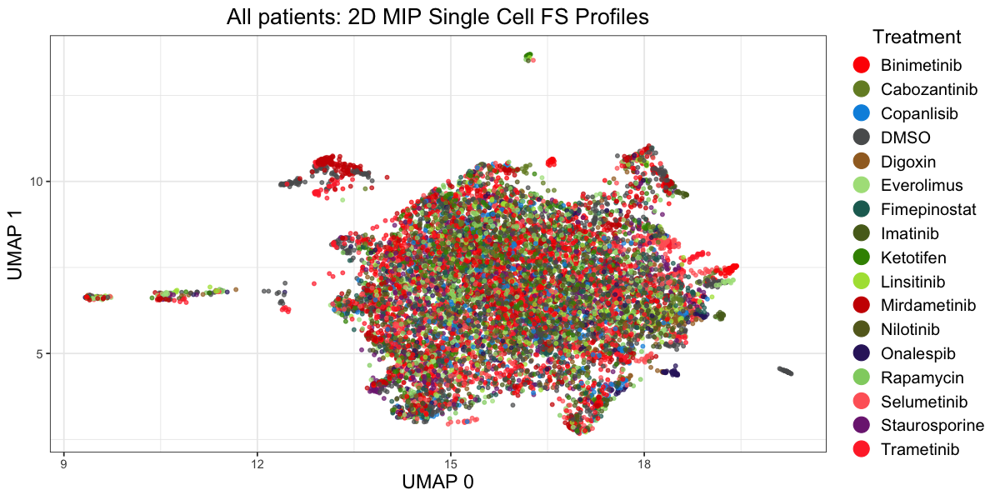

In [40]:
width <- 10
height <- 5
options(repr.plot.width = width, repr.plot.height = height)
umap_sc_plot <- (
    ggplot(max_projection_2D_sc_umap_results, aes(x = UMAP1, y = UMAP2, color = Metadata_treatment))
    + geom_point(alpha = 0.7, size = 1)
    + scale_color_manual(values = custom_treatment_palette)
    + labs(title = "All patients: 2D MIP Single Cell FS Profiles", x = "UMAP 0", y = "UMAP 1")
    + theme_bw()
    + umap_theme

    + guides(
        color = guide_legend(
            title = "Treatment",
            override.aes = list(alpha = 1, size = 5),
            ncol = 1
        )
    )
)
sc_features_path <- file.path(figures_path, "all_patients_umap_2D_max_intensity_sc_features_by_treatment.png")

ggsave(umap_sc_plot, file = sc_features_path, width = width, height = height, dpi = 300)
umap_sc_plot

All patients 2D Middle Slice single cell fs profiles colored by treatment

Warning message:
“Removed 1412 rows containing missing values or values outside the scale range
(`geom_point()`).”
Warning message:
“Removed 1412 rows containing missing values or values outside the scale range
(`geom_point()`).”
Warning message:
“Removed 1412 rows containing missing values or values outside the scale range
(`geom_point()`).”


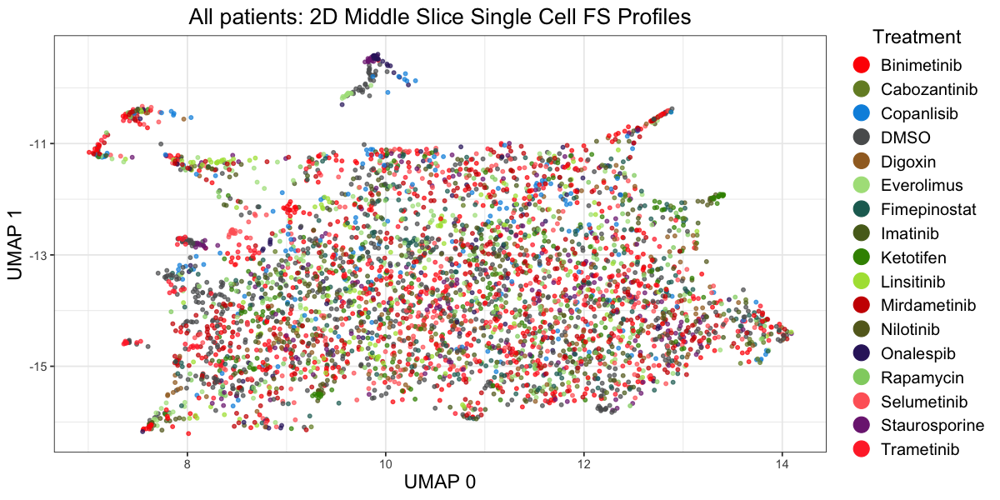

In [41]:
width <- 10
height <- 5
options(repr.plot.width = width, repr.plot.height = height)
umap_sc_plot <- (
    ggplot(middle_slice_2D_sc_umap_results, aes(x = UMAP1, y = UMAP2, color = Metadata_treatment))
    + geom_point(alpha = 0.7, size = 1)
    + scale_color_manual(values = custom_treatment_palette)
    + labs(title = "All patients: 2D Middle Slice Single Cell FS Profiles", x = "UMAP 0", y = "UMAP 1")
    + theme_bw()
    + umap_theme

    + guides(
        color = guide_legend(
            title = "Treatment",
            override.aes = list(alpha = 1, size = 5),
            ncol = 1
        )
    )
)
sc_features_path <- file.path(figures_path, "all_patients_umap_2D_middle_slice_sc_features_by_treatment.png")

ggsave(umap_sc_plot, file = sc_features_path, width = width, height = height, dpi = 300)
umap_sc_plot

All patients 3D single cell fs colored by treatments

Warning message:
“Removed 10886 rows containing missing values or values outside the scale range
(`geom_point()`).”
Warning message:
“Removed 10886 rows containing missing values or values outside the scale range
(`geom_point()`).”
Warning message:
“Removed 10886 rows containing missing values or values outside the scale range
(`geom_point()`).”


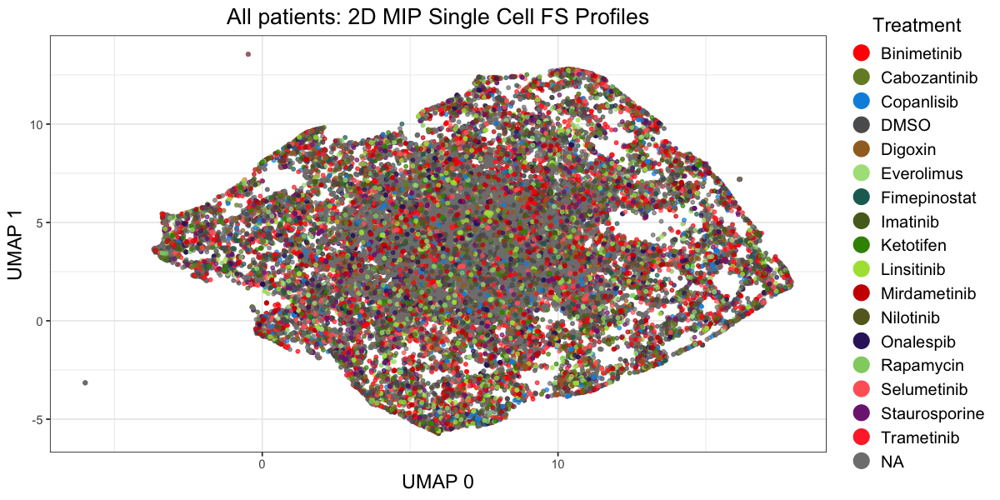

In [ ]:
width <- 10
height <- 5
options(repr.plot.width = width, repr.plot.height = height)
umap_sc_plot <- (
    ggplot(sc_3D_umap_results, aes(x = UMAP1, y = UMAP2, color = Metadata_treatment))
    + geom_point(alpha = 0.7, size = 1)
    + scale_color_manual(values = custom_treatment_palette)
    + labs(title = "All patients: 3D Single Cell FS Profiles", x = "UMAP 0", y = "UMAP 1")
    + theme_bw()
    + umap_theme

    + guides(
        color = guide_legend(
            title = "Treatment",
            override.aes = list(alpha = 1, size = 5),
            ncol = 1
        )
    )
)
sc_features_path <- file.path(figures_path, "all_patients_umap_3D_sc_features_by_treatment.png")

ggsave(umap_sc_plot, file = sc_features_path, width = width, height = height, dpi = 300)
umap_sc_plot

## Single patient UMAPs

Warning message:
“Removed 8 rows containing missing values or values outside the scale range
(`geom_point()`).”
Warning message:
“Removed 65 rows containing missing values or values outside the scale range
(`geom_point()`).”


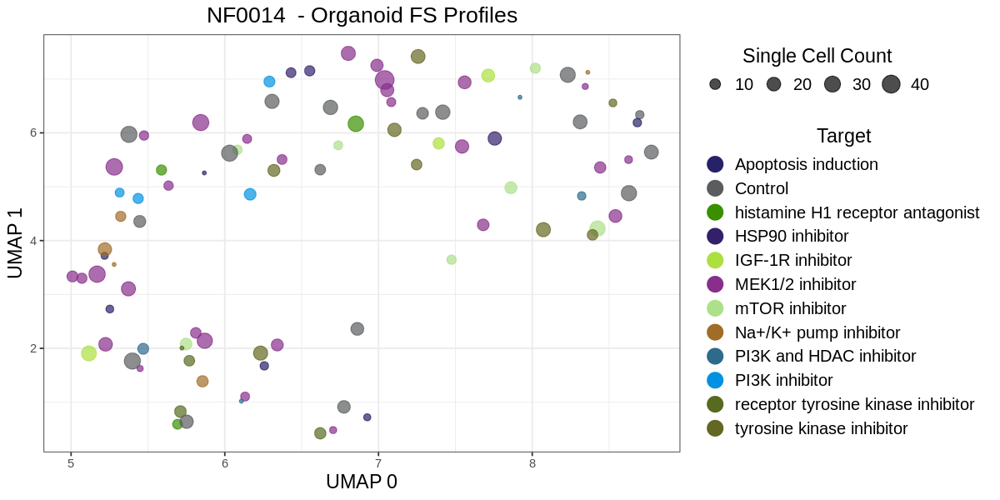

Warning message:
“Removed 65 rows containing missing values or values outside the scale range
(`geom_point()`).”
Warning message:
“Removed 8 rows containing missing values or values outside the scale range
(`geom_point()`).”
Warning message:
“Removed 65 rows containing missing values or values outside the scale range
(`geom_point()`).”
Warning message:
“Removed 65 rows containing missing values or values outside the scale range
(`geom_point()`).”


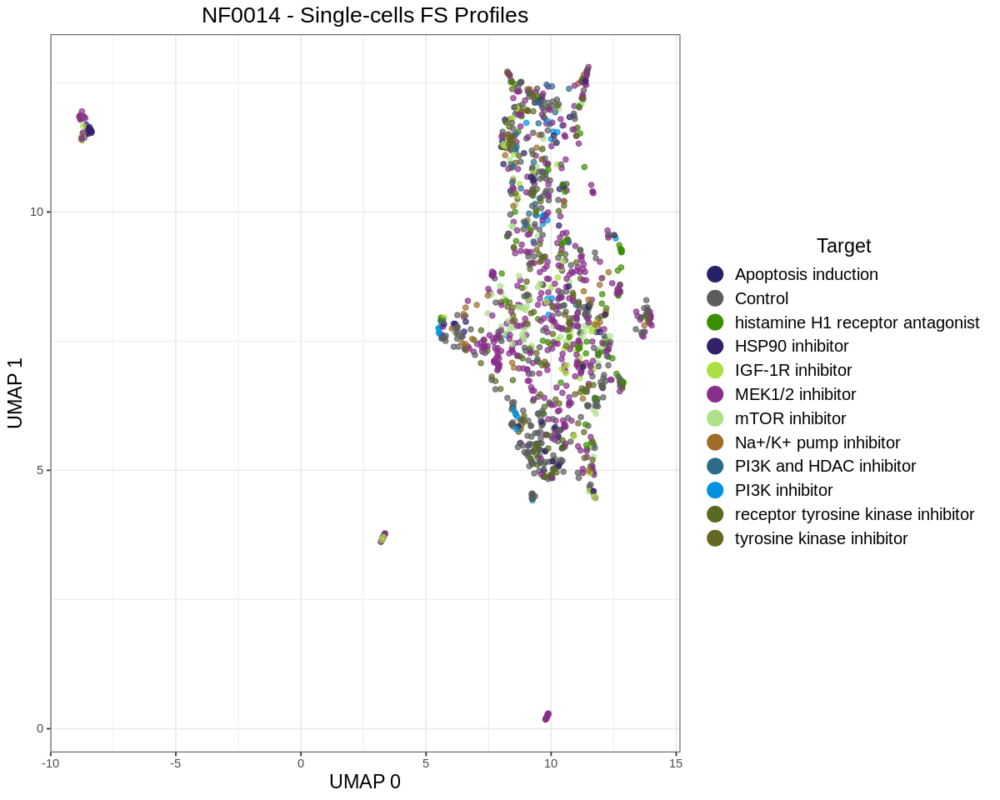

Warning message:
“Removed 38 rows containing missing values or values outside the scale range
(`geom_point()`).”


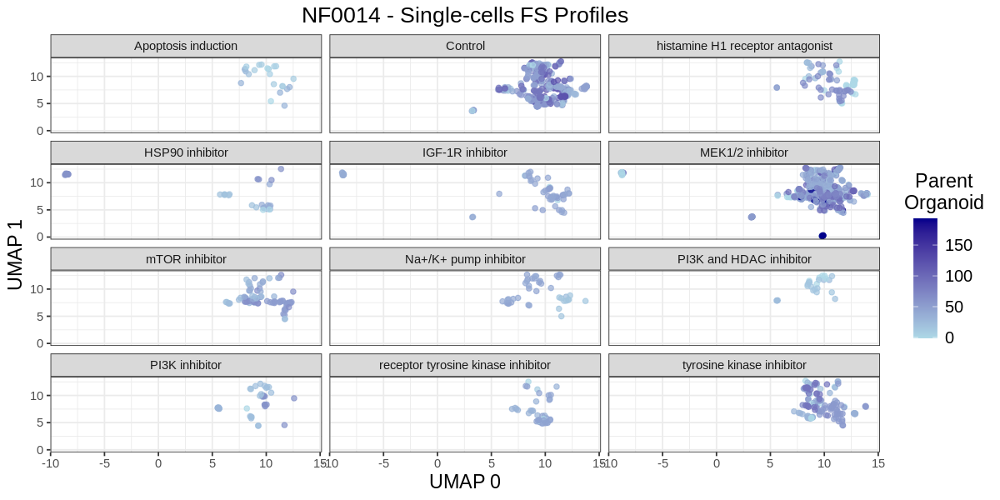

Warning message:
“Removed 14 rows containing missing values or values outside the scale range
(`geom_point()`).”


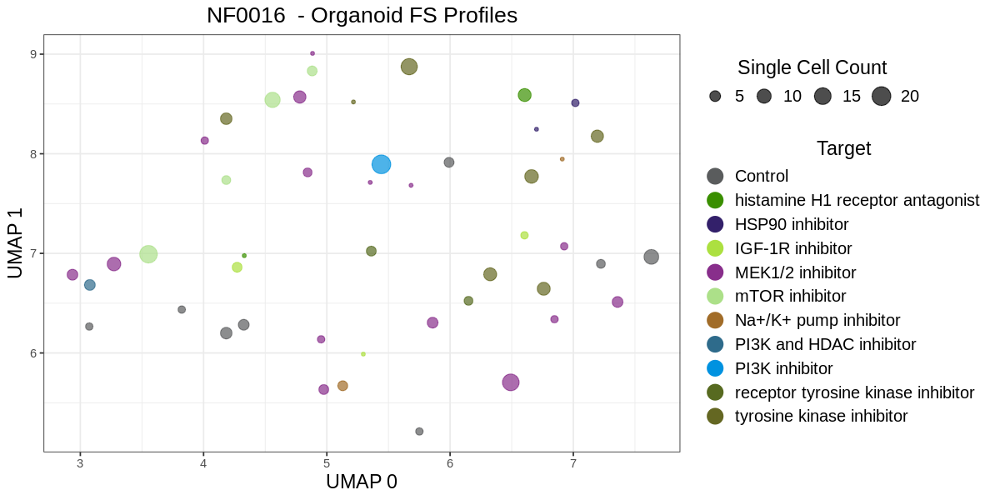

Warning message:
“Removed 14 rows containing missing values or values outside the scale range
(`geom_point()`).”
Warning message:
“Removed 38 rows containing missing values or values outside the scale range
(`geom_point()`).”
Warning message:
“Removed 14 rows containing missing values or values outside the scale range
(`geom_point()`).”
Warning message:
“Removed 14 rows containing missing values or values outside the scale range
(`geom_point()`).”


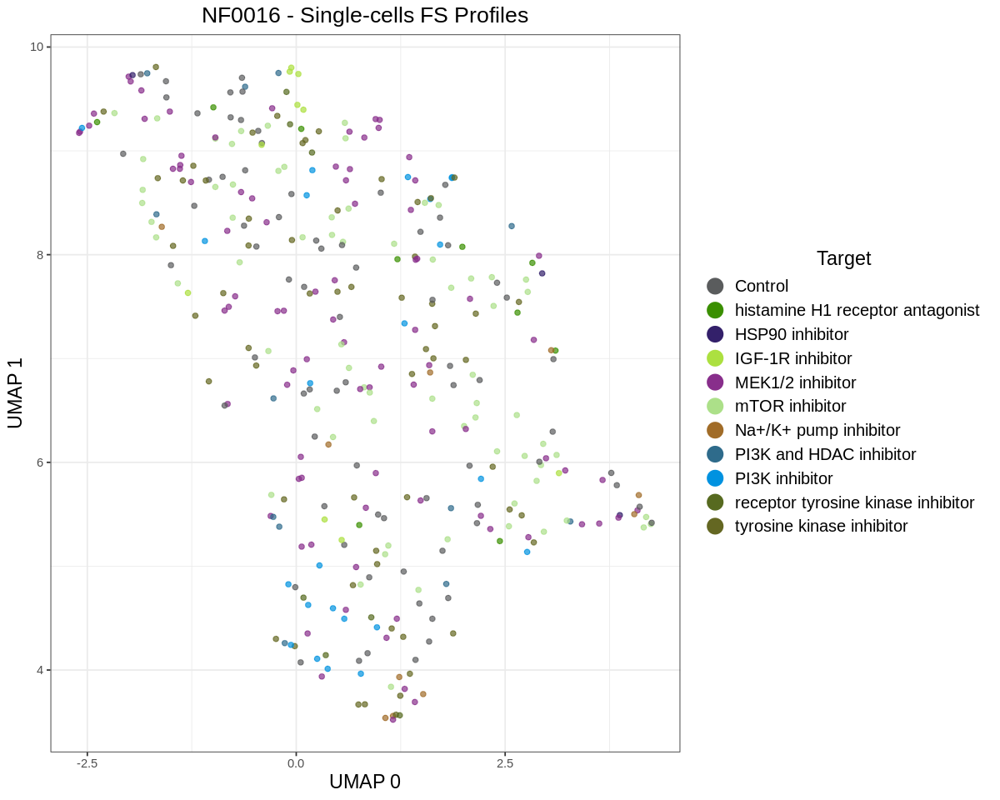

Warning message:
“Removed 46 rows containing missing values or values outside the scale range
(`geom_point()`).”


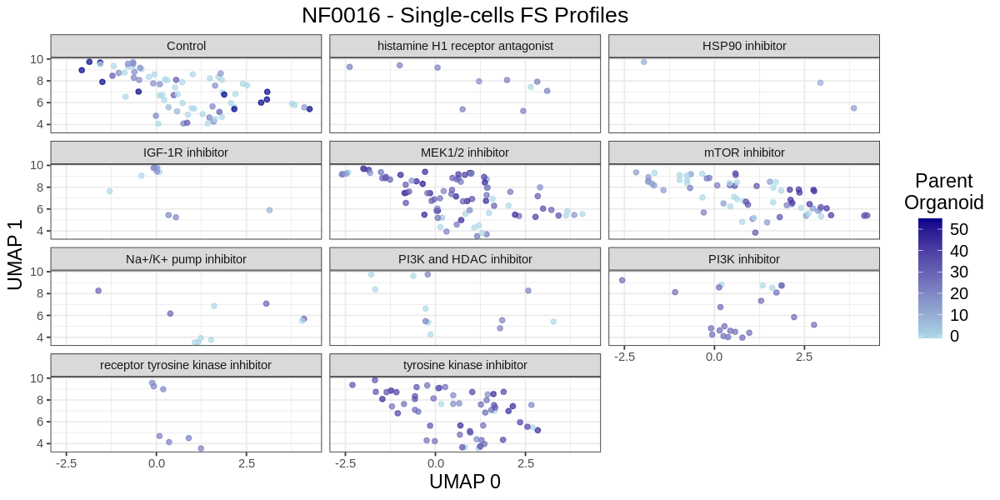

Warning message:
“Removed 26 rows containing missing values or values outside the scale range
(`geom_point()`).”


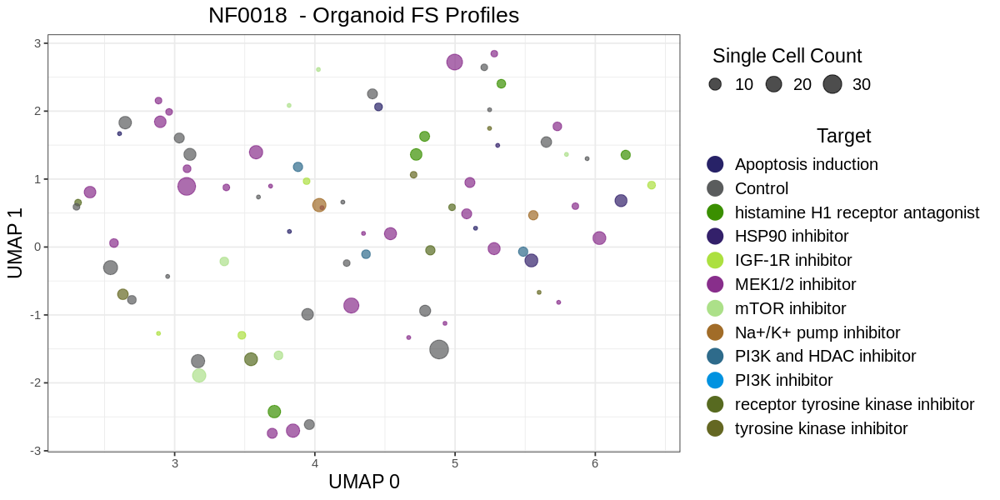

Warning message:
“Removed 26 rows containing missing values or values outside the scale range
(`geom_point()`).”
Warning message:
“Removed 46 rows containing missing values or values outside the scale range
(`geom_point()`).”
Warning message:
“Removed 26 rows containing missing values or values outside the scale range
(`geom_point()`).”
Warning message:
“Removed 26 rows containing missing values or values outside the scale range
(`geom_point()`).”


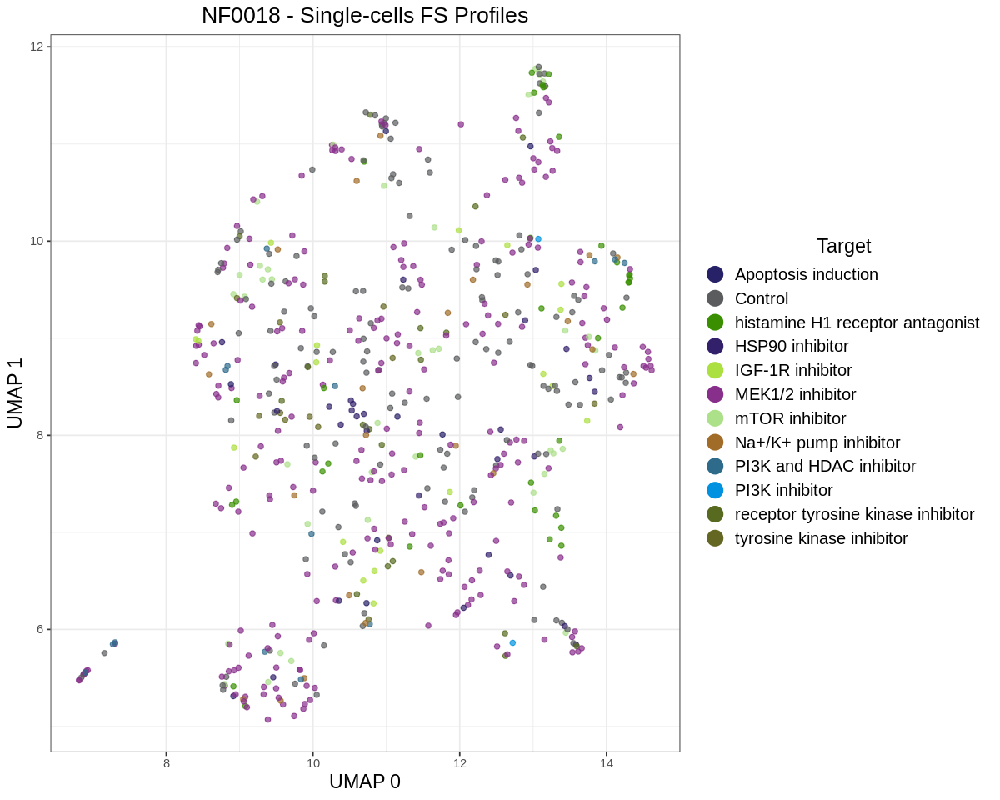

Warning message:
“Removed 50 rows containing missing values or values outside the scale range
(`geom_point()`).”


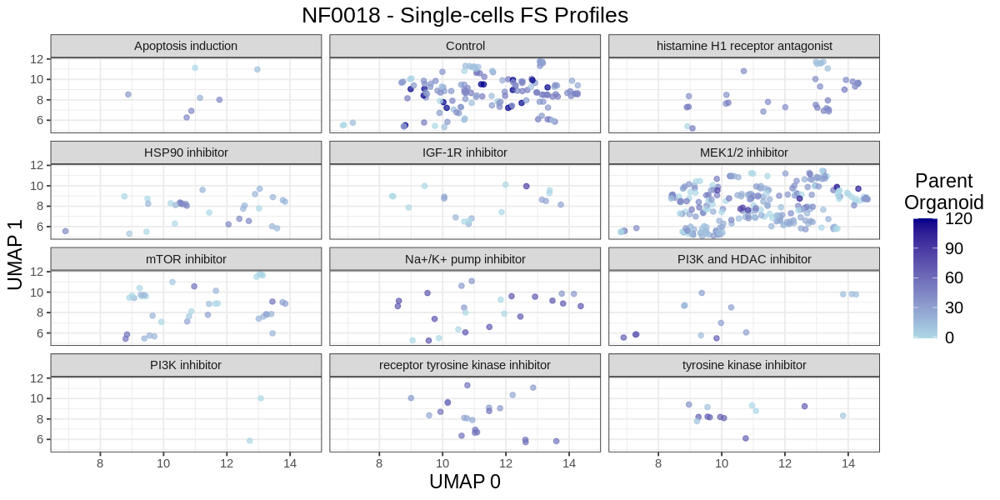

Warning message:
“Removed 148 rows containing missing values or values outside the scale range
(`geom_point()`).”


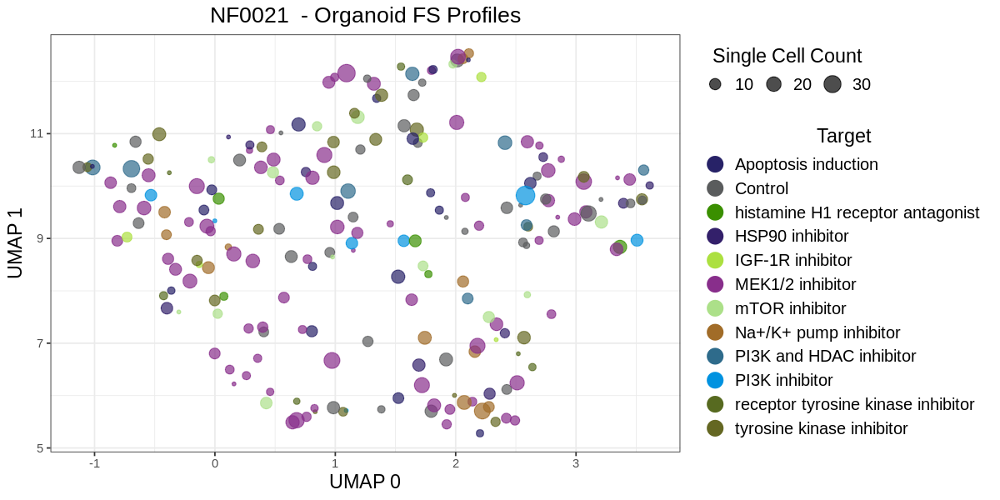

Warning message:
“Removed 148 rows containing missing values or values outside the scale range
(`geom_point()`).”
Warning message:
“Removed 50 rows containing missing values or values outside the scale range
(`geom_point()`).”
Warning message:
“Removed 148 rows containing missing values or values outside the scale range
(`geom_point()`).”
Warning message:
“Removed 148 rows containing missing values or values outside the scale range
(`geom_point()`).”


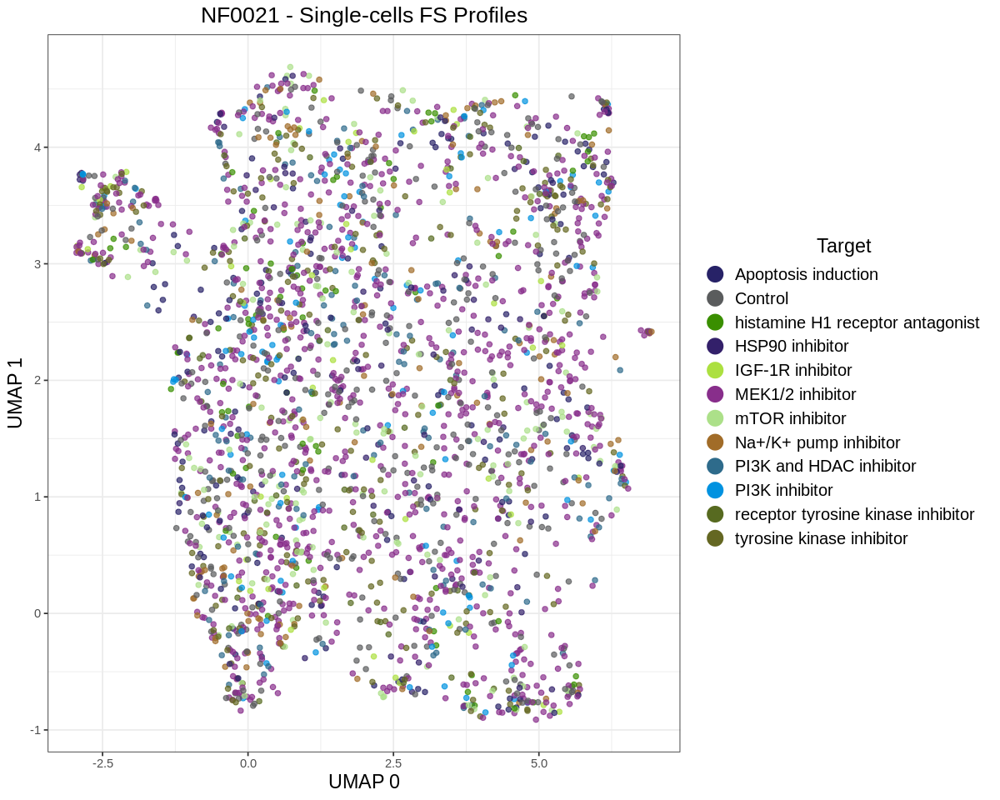

Warning message:
“Removed 36 rows containing missing values or values outside the scale range
(`geom_point()`).”


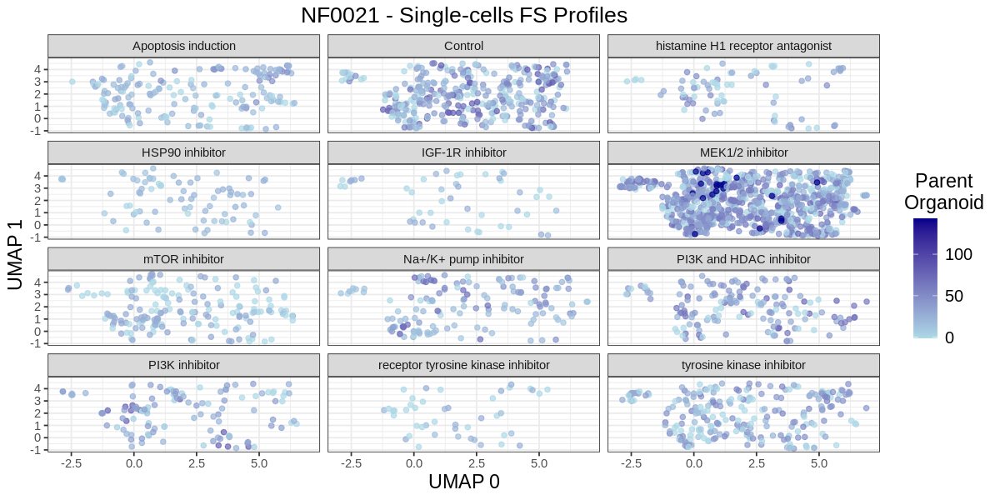

Warning message:
“Removed 44 rows containing missing values or values outside the scale range
(`geom_point()`).”


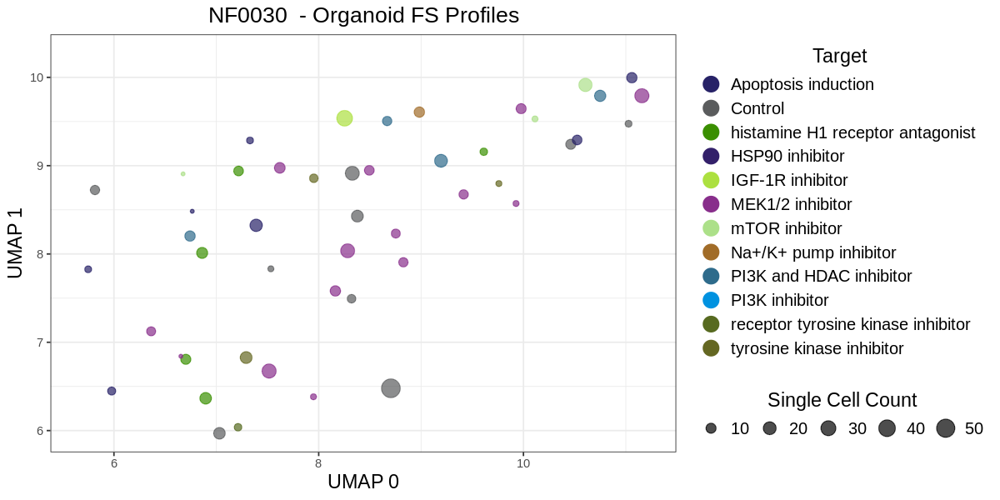

Warning message:
“Removed 44 rows containing missing values or values outside the scale range
(`geom_point()`).”
Warning message:
“Removed 36 rows containing missing values or values outside the scale range
(`geom_point()`).”
Warning message:
“Removed 44 rows containing missing values or values outside the scale range
(`geom_point()`).”
Warning message:
“Removed 44 rows containing missing values or values outside the scale range
(`geom_point()`).”


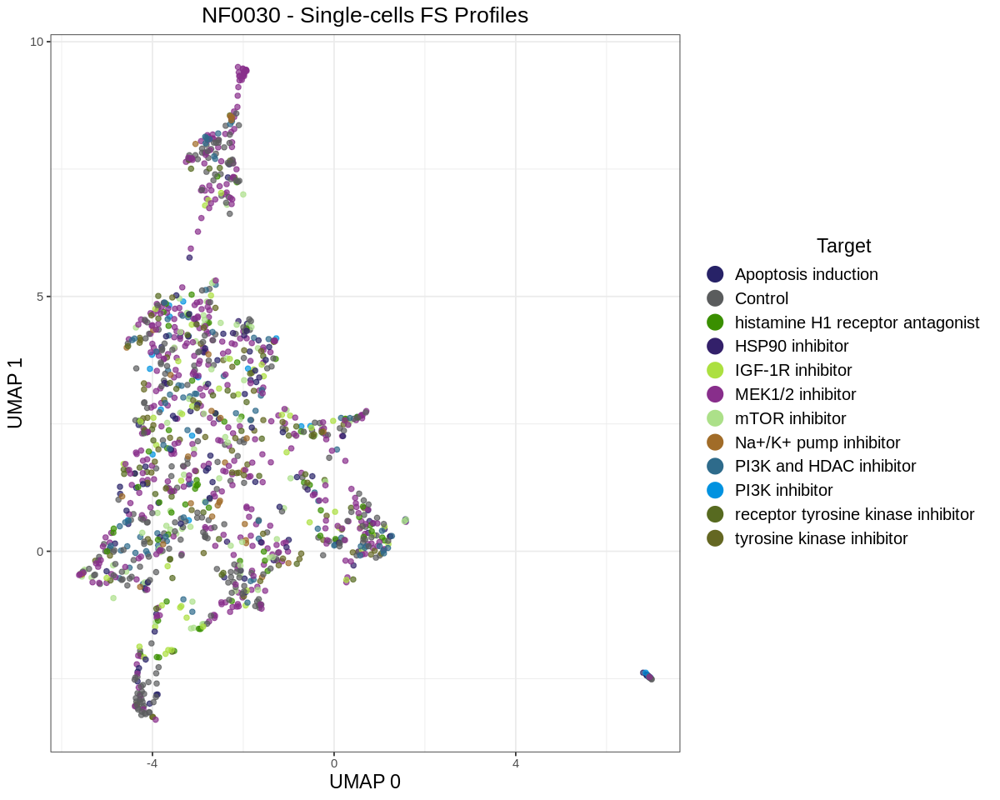

Warning message:
“Removed 90 rows containing missing values or values outside the scale range
(`geom_point()`).”


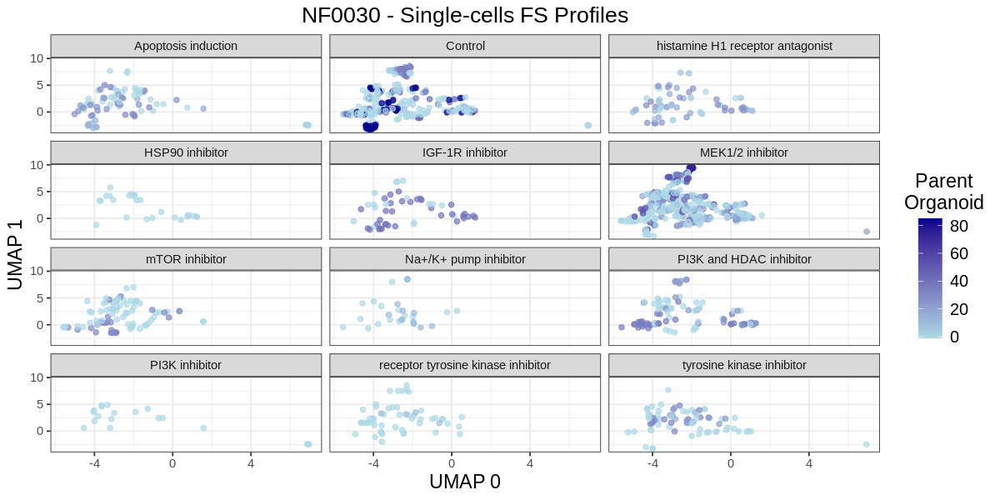

Warning message:
“Removed 86 rows containing missing values or values outside the scale range
(`geom_point()`).”


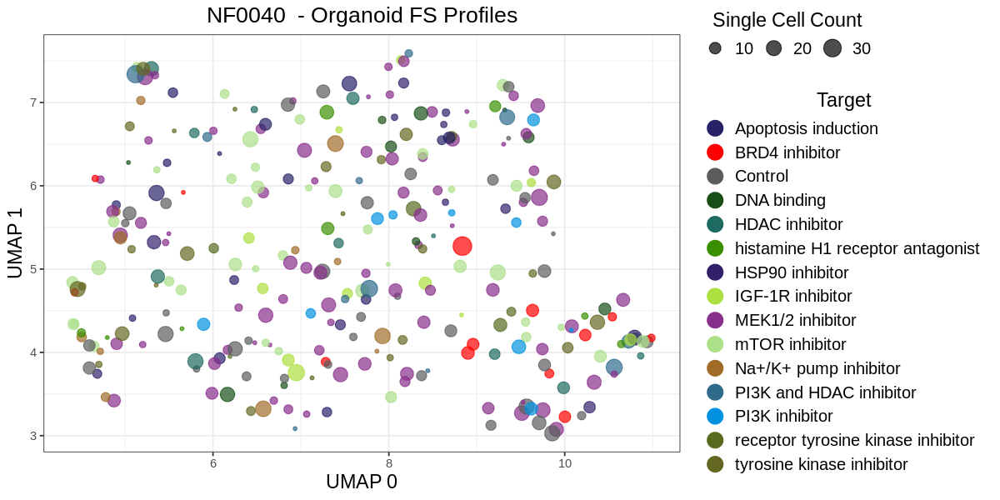

Warning message:
“Removed 86 rows containing missing values or values outside the scale range
(`geom_point()`).”
Warning message:
“Removed 90 rows containing missing values or values outside the scale range
(`geom_point()`).”
Warning message:
“Removed 86 rows containing missing values or values outside the scale range
(`geom_point()`).”
Warning message:
“Removed 86 rows containing missing values or values outside the scale range
(`geom_point()`).”


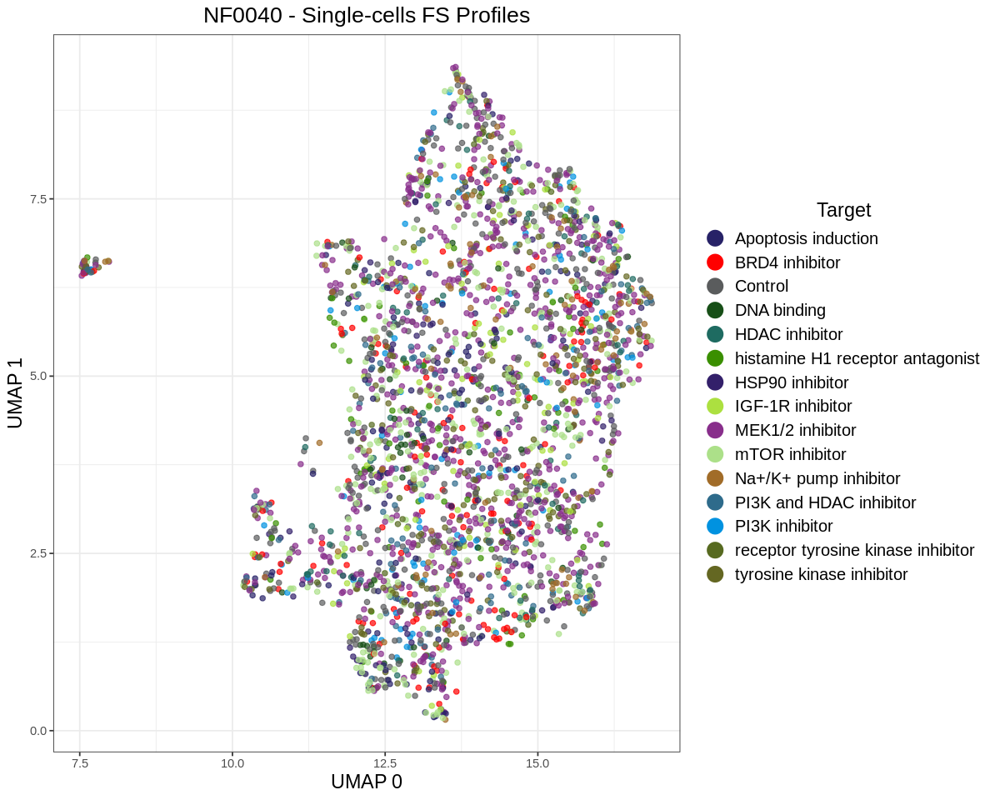

Warning message:
“Removed 91 rows containing missing values or values outside the scale range
(`geom_point()`).”


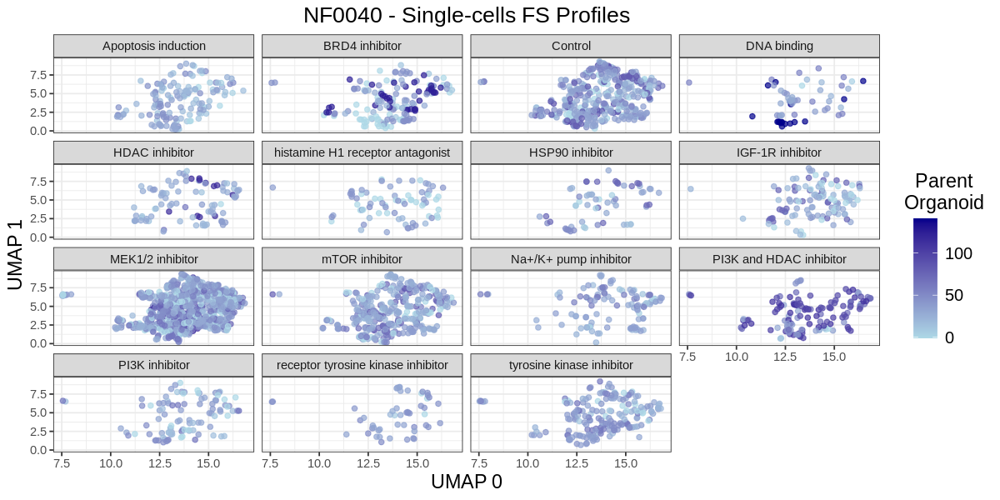

Warning message:
“Removed 32 rows containing missing values or values outside the scale range
(`geom_point()`).”


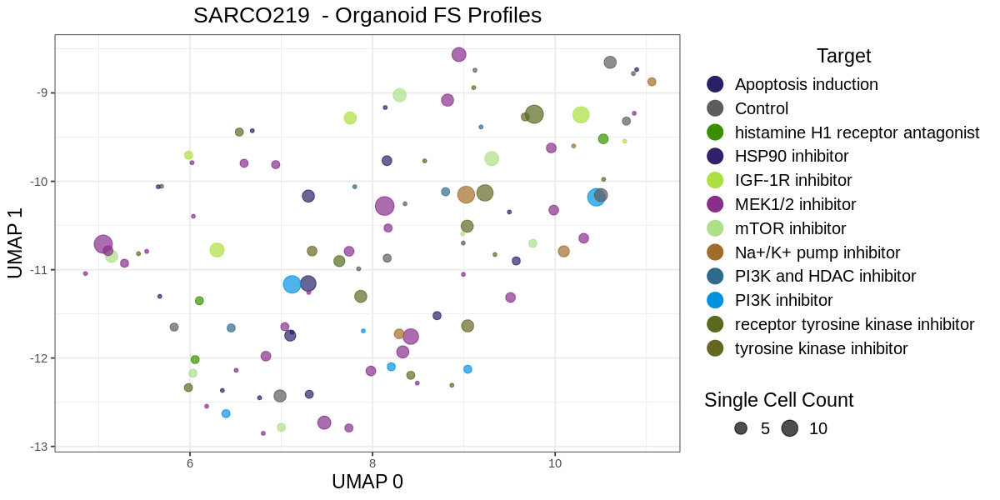

Warning message:
“Removed 32 rows containing missing values or values outside the scale range
(`geom_point()`).”
Warning message:
“Removed 91 rows containing missing values or values outside the scale range
(`geom_point()`).”
Warning message:
“Removed 32 rows containing missing values or values outside the scale range
(`geom_point()`).”
Warning message:
“Removed 32 rows containing missing values or values outside the scale range
(`geom_point()`).”


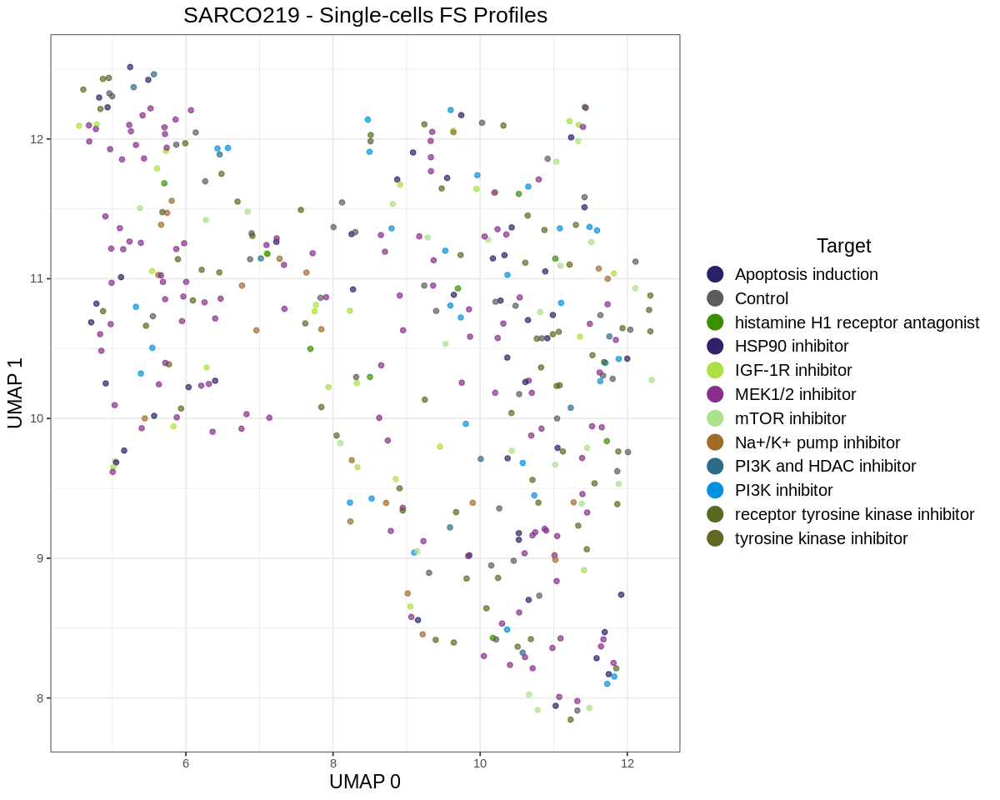

Warning message:
“Removed 100 rows containing missing values or values outside the scale range
(`geom_point()`).”


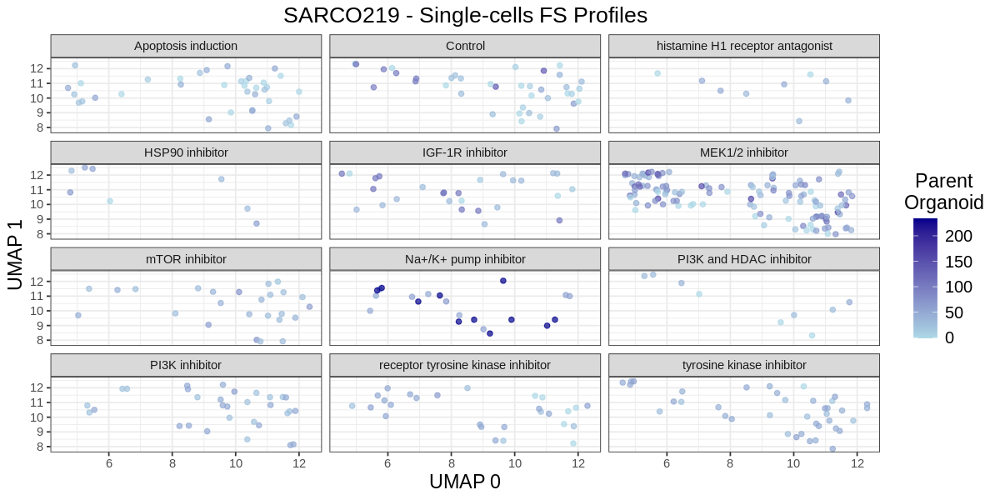

Warning message:
“Removed 1144 rows containing missing values or values outside the scale range
(`geom_point()`).”


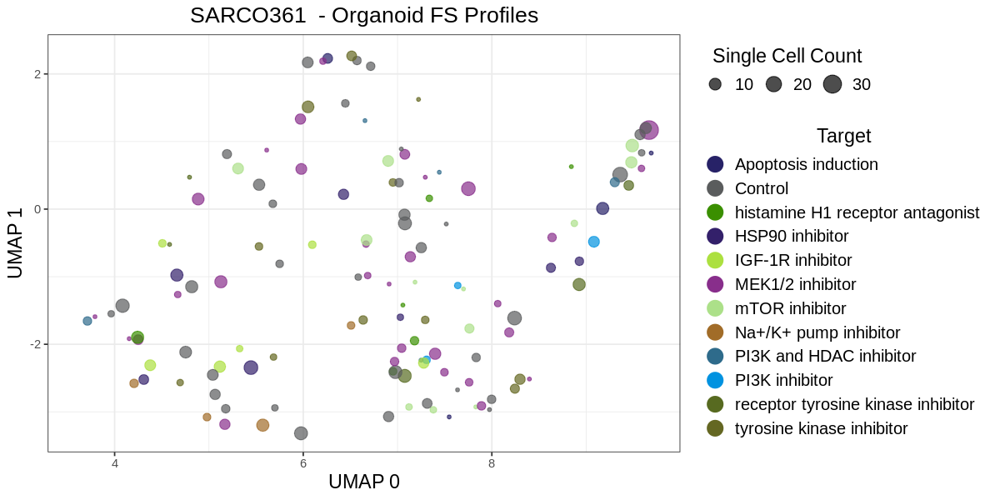

Warning message:
“Removed 1144 rows containing missing values or values outside the scale range
(`geom_point()`).”
Warning message:
“Removed 100 rows containing missing values or values outside the scale range
(`geom_point()`).”
Warning message:
“Removed 1144 rows containing missing values or values outside the scale range
(`geom_point()`).”
Warning message:
“Removed 1144 rows containing missing values or values outside the scale range
(`geom_point()`).”


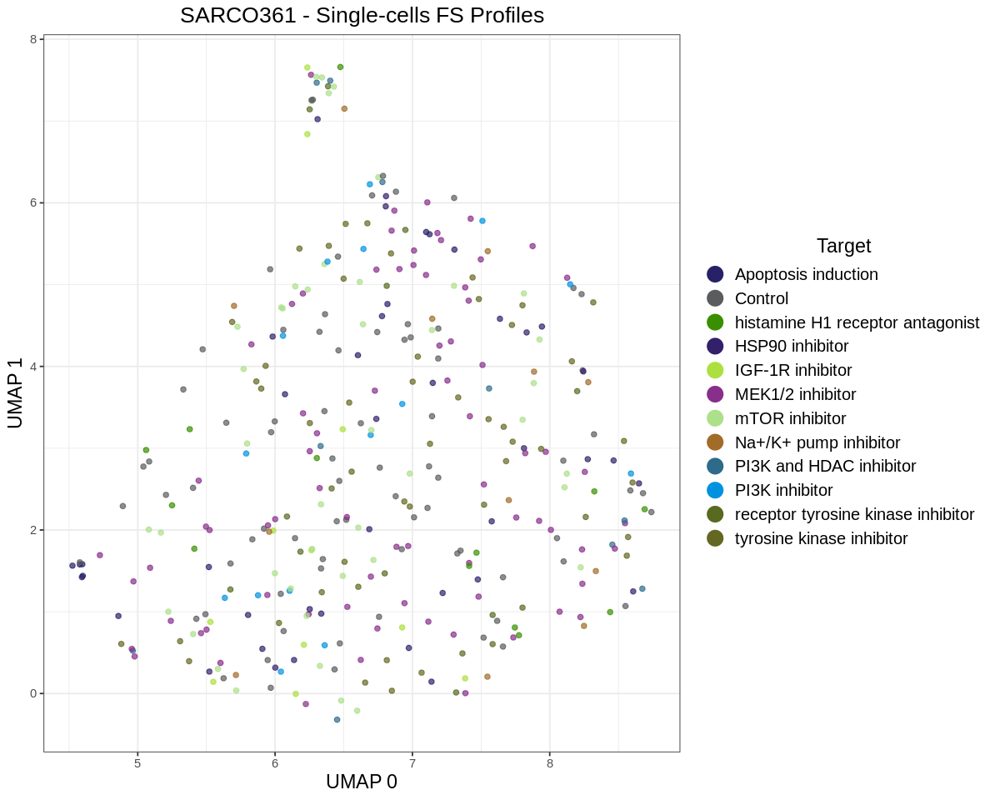

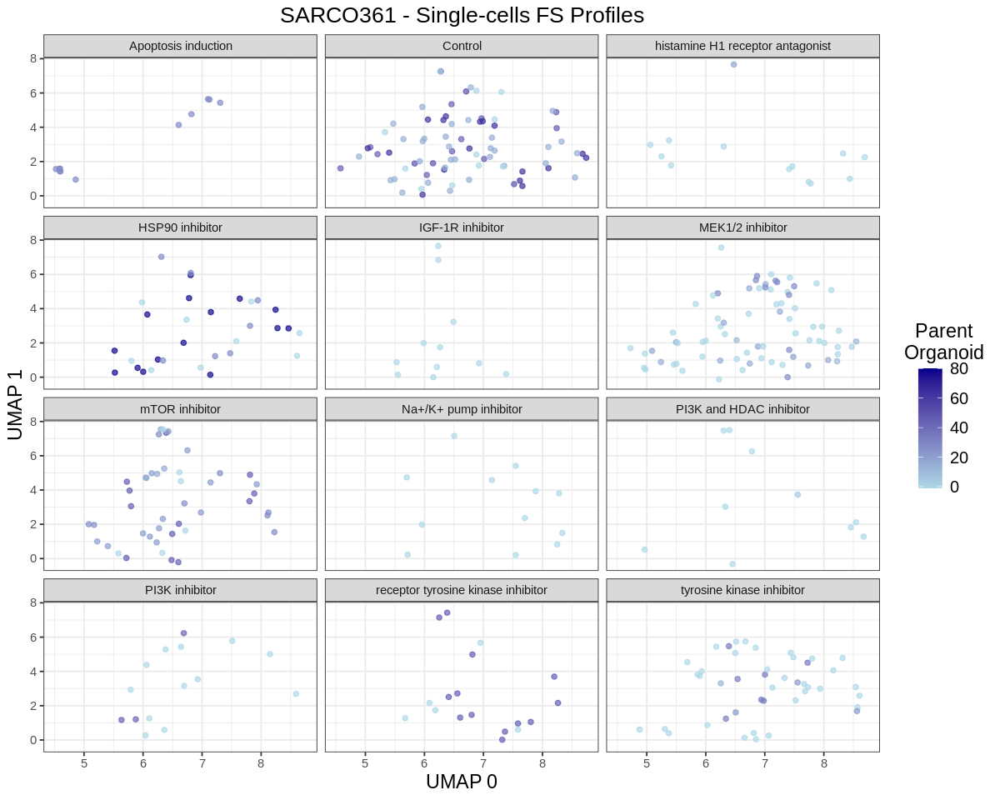

In [ ]:
for (patient in patients) {
    patient_umap_file_path <- file.path(root_dir, paste0("5.EDA/results/patient_results/",patient,"_organoid_fs_umap.parquet"))
    umap_results_patient <- arrow::read_parquet(patient_umap_file_path)
    umap_results_patient

    width <- 10
    height <- 5
    options(repr.plot.width = width, repr.plot.height = height)
    umap_organoid_plot <- (
        ggplot(umap_results_patient, aes(x = UMAP1, y = UMAP2, color = Target, size = single_cell_count))
        + geom_point(alpha = 0.7)
        + scale_color_manual(values = custom_MOA_palette)
        + labs(title = paste(patient," - Organoid FS Profiles"), x = "UMAP 0", y = "UMAP 1")
        + theme_bw()
        + umap_theme

        + guides(
            size = guide_legend(
                title = "Single Cell Count",
                text = element_text(size = 16, hjust = 0.5),
                # make two columns for the legend
                nrow = 1,
                # title position to top

                # move to bottom
                # position = "bottom"
                
                ),
            color = guide_legend(
                title = "Target",
                text = element_text(size = 16, hjust = 0.5, position = "top"),
                override.aes = list(alpha = 1,size = 5),
                # nrow = 2,
                ncol = 1
                # position = "bottom"
            )
        )
        
    )
    print(umap_organoid_plot)
    patient_umap_file_path <- file.path(root_dir, paste0("5.EDA/results/patient_results/",patient,"_sc_fs_umap.parquet"))
    umap_results_patient <- arrow::read_parquet(patient_umap_file_path)
    umap_results_patient$parent_organoid <- as.numeric(umap_results_patient$parent_organoid)
    width <- 10
    height <- 5
    options(repr.plot.width = width, repr.plot.height = height)
    umap_sc_color_by_target_plot <- (
        ggplot(umap_results_patient, aes(x = UMAP1, y = UMAP2, color = Target))
        + geom_point(alpha = 0.7)
        # make the colors continuous
        + scale_color_manual(values = custom_MOA_palette)
        + labs(title = paste0(patient," - Single-cells FS Profiles"), x = "UMAP 0", y = "UMAP 1")
        + theme_bw()
        + umap_theme
        + guides(
            color = guide_legend(
                title = "Target",
                text = element_text(size = 16, hjust = 0.5, position = "top"),
                override.aes = list(alpha = 1,size = 5),
                # nrow = 2,
                ncol = 1
                # position = "bottom"
            )
        )
        
    )
    print(umap_sc_color_by_target_plot)

 width <- 10
height <- 8
    options(repr.plot.width = width, repr.plot.height = height)
    umap_sc_color_by_parent_organoid <- (
        ggplot(umap_results_patient, aes(x = UMAP1, y = UMAP2, color = parent_organoid))
        + geom_point(alpha = 0.7)
        # make the colors continuous
        + scale_color_gradient(low = "lightblue", high = "darkblue")
        + labs(title = paste0(patient," - Single-cells FS Profiles"), x = "UMAP 0", y = "UMAP 1")
        + theme_bw()
        + theme(
            plot.title = element_text(hjust = 0.5, size = 16),
            axis.title.x = element_text(size = 14),
            axis.title.y = element_text(size = 14),
            legend.title = element_text(size = 14, hjust = 0.5),
            legend.text = element_text(size = 12)
        )
        + guides(
            color = guide_colorbar(
                title = "Parent\nOrganoid",
                title.position = "top",
                title.hjust = 0.5
            )
        )
        + facet_wrap(~Target, nrow = 4)
        
    )
    print(umap_sc_color_by_parent_organoid)


    organoid_features_path = file.path(figures_path, paste0(patient,"_organoid_fs_umap.png"))
    single_cell_features_path = file.path(figures_path, paste0(patient,"_sc_fs_umap_color_by_target.png"))
    single_cell_features_parent_colors = file.path(figures_path, paste0(patient,"_sc_fs_umap_color_by_parent_organoid.png"))

    ggsave(umap_organoid_plot, file = organoid_features_path, width = width, height = height, dpi = 400)
    ggsave(umap_sc_color_by_target_plot, file = single_cell_features_path, width = width, height = height, dpi = 400)
    ggsave(umap_sc_color_by_parent_organoid, file = single_cell_features_parent_colors, width = width, height = height, dpi = 400)
}
